In [1]:
import pandas as pd
import numpy as np

weather = pd.read_csv("weather.csv", index_col="DATE")

In [2]:
null_pct = weather.apply(pd.isnull).sum()/weather.shape[0]
valid_columns = weather.columns[null_pct < .05]

In [3]:
weather = weather[valid_columns].copy()
weather.columns = weather.columns.str.lower()

In [4]:
weather = weather.ffill()

In [5]:
weather.index = pd.to_datetime(weather.index)

In [6]:
weather["y"] = weather.shift(-1)["tmax"]
weather = weather.ffill()

In [7]:
weather["ds"] = weather.index

In [8]:
weather.shape

(19287, 9)

In [9]:
predictors = weather.columns[~weather.columns.isin(["y", "name", "station", "ds"])]

In [10]:
train = weather[:"2021-12-31"]
test = weather["2021-12-31":]

In [25]:
from prophet import Prophet

def fit_prophet(train):
    m = Prophet()
    for p in predictors:
        m.add_regressor(p)
    m.fit(train)
    return m

m = fit_prophet(train)

In [26]:
predictions = m.predict(test)

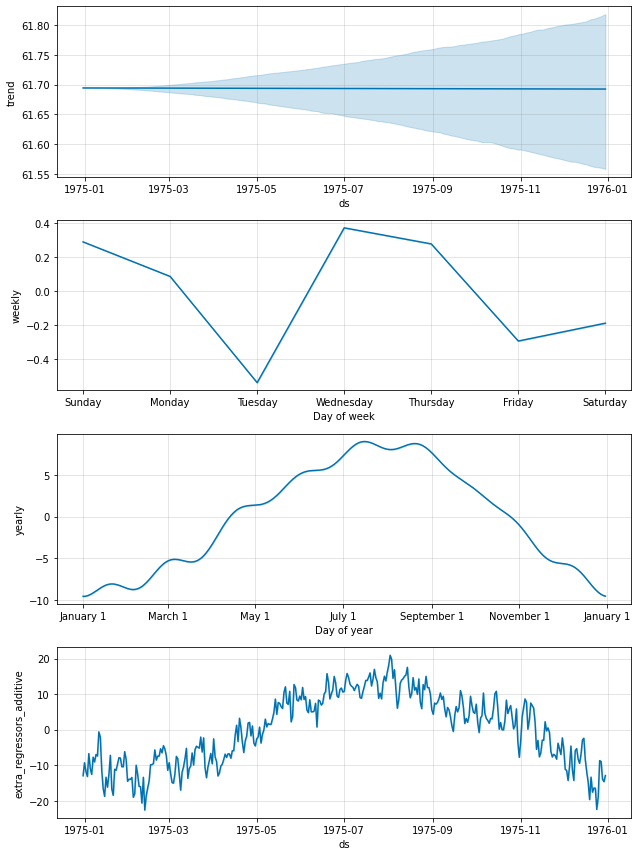

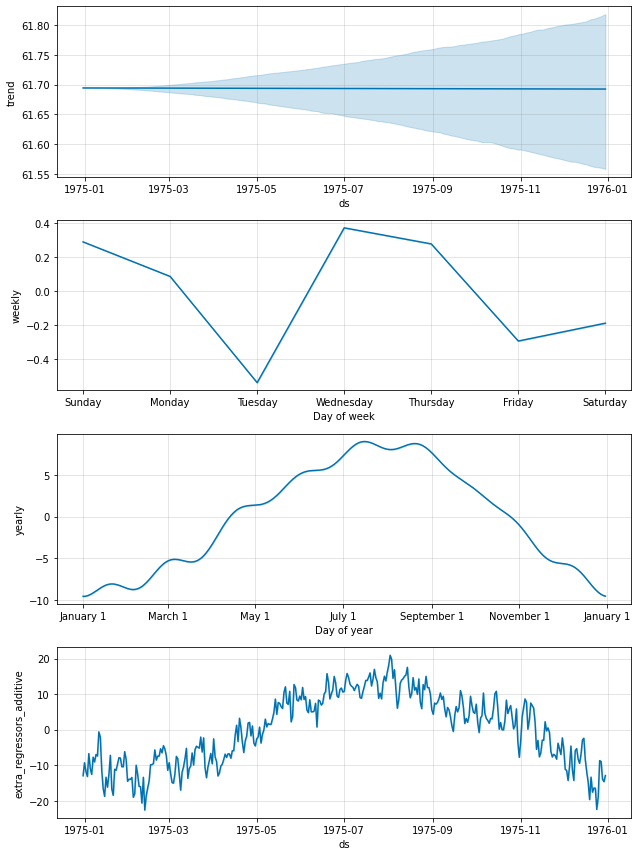

In [27]:
m.plot_components(predictions)

In [28]:
predictions.index = test.index
predictions["actual"] = test["y"]

In [29]:
from prophet.utilities import regressor_coefficients

regressor_coefficients(m)

,regressor,regressor_mode,center,coef_lower,coef,coef_upper
0,prcp,additive,0.106597,-1.464834,-1.464834,-1.464834
1,snow,additive,0.039342,-0.666725,-0.666725,-0.666725
2,snwd,additive,0.050411,-0.244041,-0.244041,-0.244041
3,tmax,additive,61.578082,0.298692,0.298692,0.298692
4,tmin,additive,47.478904,0.333951,0.333951,0.333951


In [30]:
predictions["se"] = ((predictions["actual"] - predictions["yhat"]) ** 2)
print(predictions["se"].mean())

37.59409811671803


In [31]:
from tqdm import tqdm
import logging
logger = logging.getLogger('cmdstanpy')
logger.propagate = False
logger.addHandler(logging.NullHandler())
logger.setLevel(logging.CRITICAL)

forecasts = []

STEP = 365
START = 365 * 5
for i in tqdm(range(START,weather.shape[0]-STEP,STEP)):
    train_end = i
    test_end = train_end + STEP
    
    train = weather[0:train_end]
    test = weather[train_end:test_end]

    m = fit_prophet(train)
    predictions = m.predict(test)
    forecasts.append(predictions)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [01:15<00:00,  1.61s/it]


In [32]:
all_forecasts = pd.concat(forecasts)
combined = all_forecasts.merge(weather[["y"]], left_on="ds", right_index=True)
combined.index = combined["ds"]

In [35]:
combined["se"] = ((combined["y"] - combined["yhat"]) ** 2)
print(combined["se"].mean())

38.29466983611263


<AxesSubplot:xlabel='ds'>

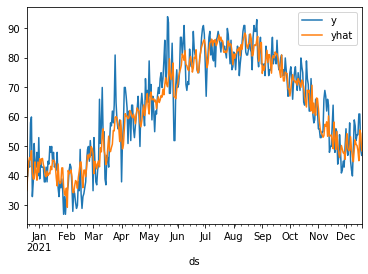

In [23]:
combined[["y", "yhat"]][-365:].plot()

In [38]:
m = Prophet()
m.fit(weather)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

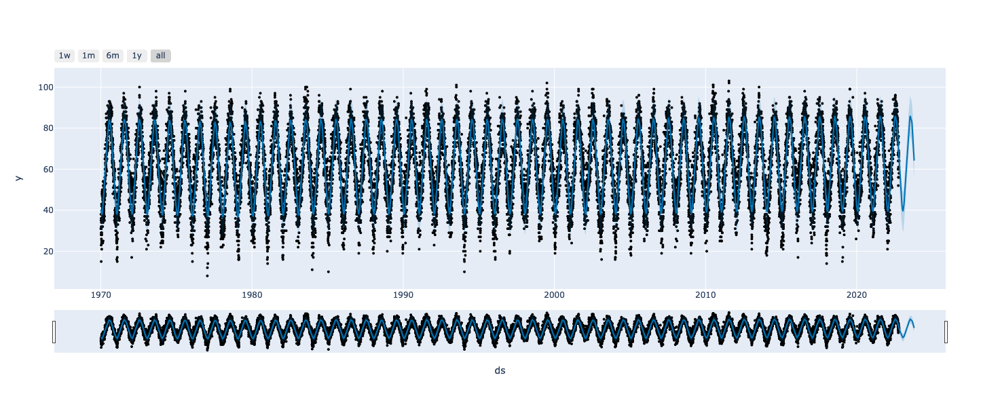

In [41]:
from prophet.plot import plot_plotly

plot_plotly(m, forecast)